In [ ]:
!git clone --depth 1 https://github.com/Hzzone/PseCo
import sys
sys.path.insert(0, './PseCo')
!nvidia-smi
# make sure that GPU is used

Cloning into 'PseCo'...
remote: Enumerating objects: 53, done.
remote: Counting objects: 100% (53/53), done.
remote: Compressing objects: 100% (48/48), done.
remote: Total 53 (delta 3), reused 53 (delta 3), pack-reused 0
Receiving objects: 100% (53/53), 22.52 MiB | 28.26 MiB/s, done.
Resolving deltas: 100% (3/3), done.
Wed Dec 13 08:36:41 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A  

In [ ]:
!pip install -r ./PseCo/requirements.txt

In [ ]:
import gdown
gdown.download_folder('https://drive.google.com/drive/folders/1XbUrPBANs_m0w5UfwCmHSvQpSGxBorrj')
!mkdir ./PseCo/data && mkdir ./PseCo/data/fsc147 && mv checkpoints ./PseCo/data/fsc147

Retrieving folder list


Processing file 1W3JnnqJLquRfSIyA0VsYQiPTnsvS09bC MLP_small_box_w1_fewshot.tar
Processing file 10wUs4fOPht46mcfORa_08HckCPCOi_CY MLP_small_box_w1_zeroshot.tar
Processing file 1KYeY8sZ1asQmcPVDmBUC376D53NKn84S point_decoder_vith.pth
Building directory structure completed


Retrieving folder list completed
Building directory structure
Downloading...
From: https://drive.google.com/uc?id=1W3JnnqJLquRfSIyA0VsYQiPTnsvS09bC
To: /content/checkpoints/MLP_small_box_w1_fewshot.tar
100%|██████████| 214M/214M [00:02<00:00, 92.3MB/s]
Downloading...
From: https://drive.google.com/uc?id=10wUs4fOPht46mcfORa_08HckCPCOi_CY
To: /content/checkpoints/MLP_small_box_w1_zeroshot.tar
100%|██████████| 214M/214M [00:01<00:00, 152MB/s]
Downloading...
From: https://drive.google.com/uc?id=1KYeY8sZ1asQmcPVDmBUC376D53NKn84S
To: /content/checkpoints/point_decoder_vith.pth
100%|██████████| 14.1M/14.1M [00:00<00:00, 88.5MB/s]
Download completed


In [ ]:
import os
from torchvision.utils import make_grid
from torchvision.transforms.functional import to_pil_image, to_tensor
%load_ext autoreload
%autoreload 2
import matplotlib.pyplot as plt
import torch.nn.functional as F
import torch
from PIL import Image
import numpy as np
import tqdm
import albumentations as A
import torch.nn as nn
import torchvision
import torchvision.ops as vision_ops
from ops.foundation_models.segment_anything.utils.amg import batched_mask_to_box
from ops.ops import _nms, plot_results, convert_to_cuda
plt.rcParams["figure.dpi"] = 300
torch.cuda.set_device(0)
torch.autograd.set_grad_enabled(False)
!gpustat

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
ffe64f1f394b  Wed Dec 13 08:50:54 2023  525.105.17
[0] Tesla T4 | 38°C,   0 % |     3 / 15360 MB |


In [146]:
def read_image(path):
    img = Image.open(path)
    transform = A.Compose([
        A.LongestMaxSize(1024),
        A.PadIfNeeded(1024, border_mode=0, position=A.PadIfNeeded.PositionType.TOP_LEFT),
    ])
    img = Image.fromarray(transform(image=np.array(img))['image'])
    return img

In [126]:
from ops.foundation_models.segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor, build_sam, build_sam_vit_b, build_sam_vit_h

# sam = build_sam_vit_b().cuda().eval()
sam = build_sam_vit_h().cuda().eval()

In [ ]:
project_root = './PseCo'

In [154]:
# fname = f'{project_root}/data/fsc147/images_384_VarV2/22.jpg'
fname = f'{project_root}/images/9.jpg'
image = read_image(fname)

In [129]:
from ops.dump_clip_features import dump_clip_image_features, dump_clip_text_features

In [156]:
# few-shot
example_boxes = torch.Tensor([[466., 275., 578., 469.]])
example_features = dump_clip_image_features(image, example_boxes).cuda()

from models import ROIHeadMLP as ROIHead
cls_head = ROIHead().cuda().eval()
cls_head.load_state_dict(torch.load(f'{project_root}/data/fsc147/checkpoints/MLP_small_box_w1_fewshot.tar', map_location='cpu',weights_only=False)['cls_head'])

RuntimeError: The size of tensor a (4) must match the size of tensor b (3) at non-singleton dimension 0

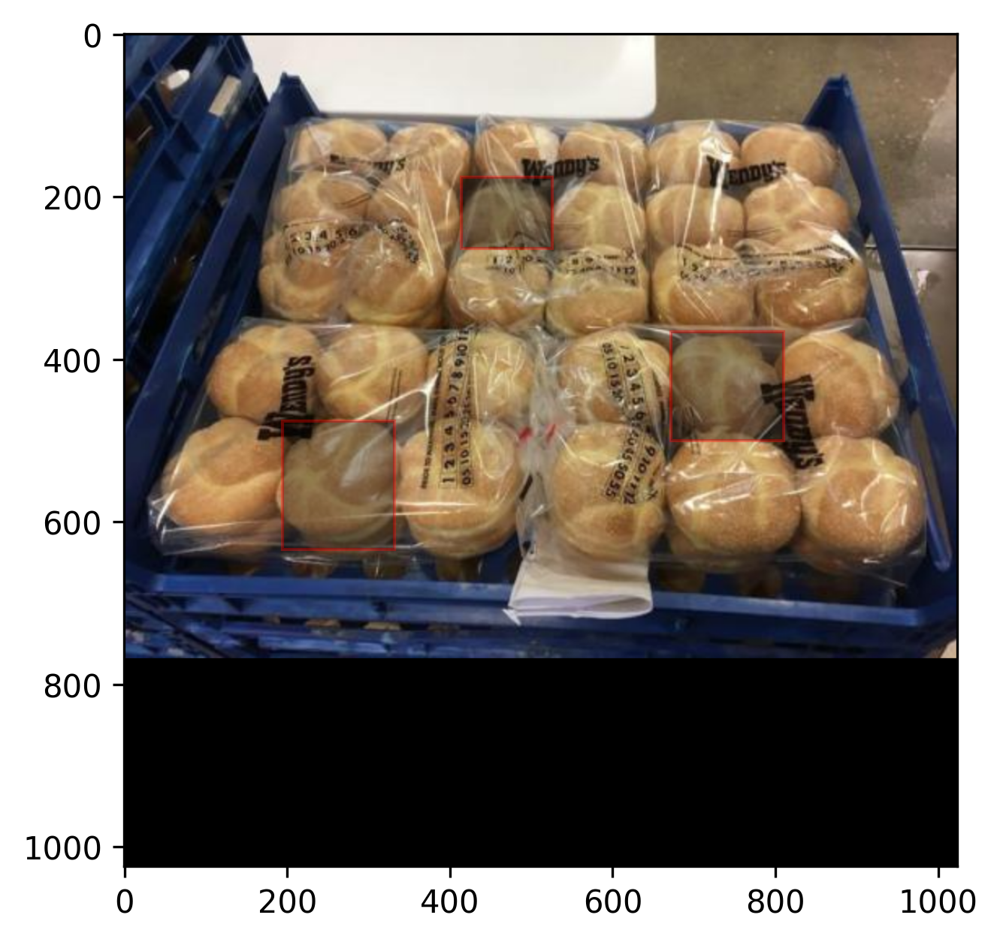

In [151]:
plot_results(read_image(fname),
    bboxes=example_boxes,
             )

In [152]:
# zeroshot
class_name = 'bread rolls'
example_features = dump_clip_text_features([class_name, ])[class_name].unsqueeze(0).cuda()
from models import ROIHeadMLP as ROIHead
cls_head = ROIHead().cuda().eval()
cls_head.load_state_dict(torch.load(f'/content/PseCo/data/fsc147/checkpoints/MLP_small_box_w1_zeroshot.tar', map_location='cpu', weights_only=False)['cls_head'])

Building text embeddings...


100%|██████████| 1/1 [00:00<00:00, 11.70it/s]


RuntimeError: PytorchStreamReader failed reading zip archive: failed finding central directory

# Extract image features

In [153]:
import torchvision.transforms as transforms
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
with torch.no_grad():
    new_image = transform(image).unsqueeze(0).cuda()
    features = sam.image_encoder(new_image)

# Load point decoder and extract heatmaps

In [ ]:
from models import PointDecoder
point_decoder = PointDecoder(sam).cuda().eval()
state_dict = torch.load(f'{project_root}/data/fsc147/checkpoints/point_decoder_vith.pth',
                        map_location='cpu')
point_decoder.load_state_dict(state_dict)
with torch.no_grad():
    point_decoder.max_points = 1000
    point_decoder.point_threshold = 0.05
    point_decoder.nms_kernel_size = 3
    outputs_heatmaps = point_decoder(features)
    pred_heatmaps = outputs_heatmaps['pred_heatmaps'].cpu().squeeze().clamp(0, 1)

# Show points

torch.Size([515, 2])


(-0.5, 1023.5, 1023.5, -0.5)

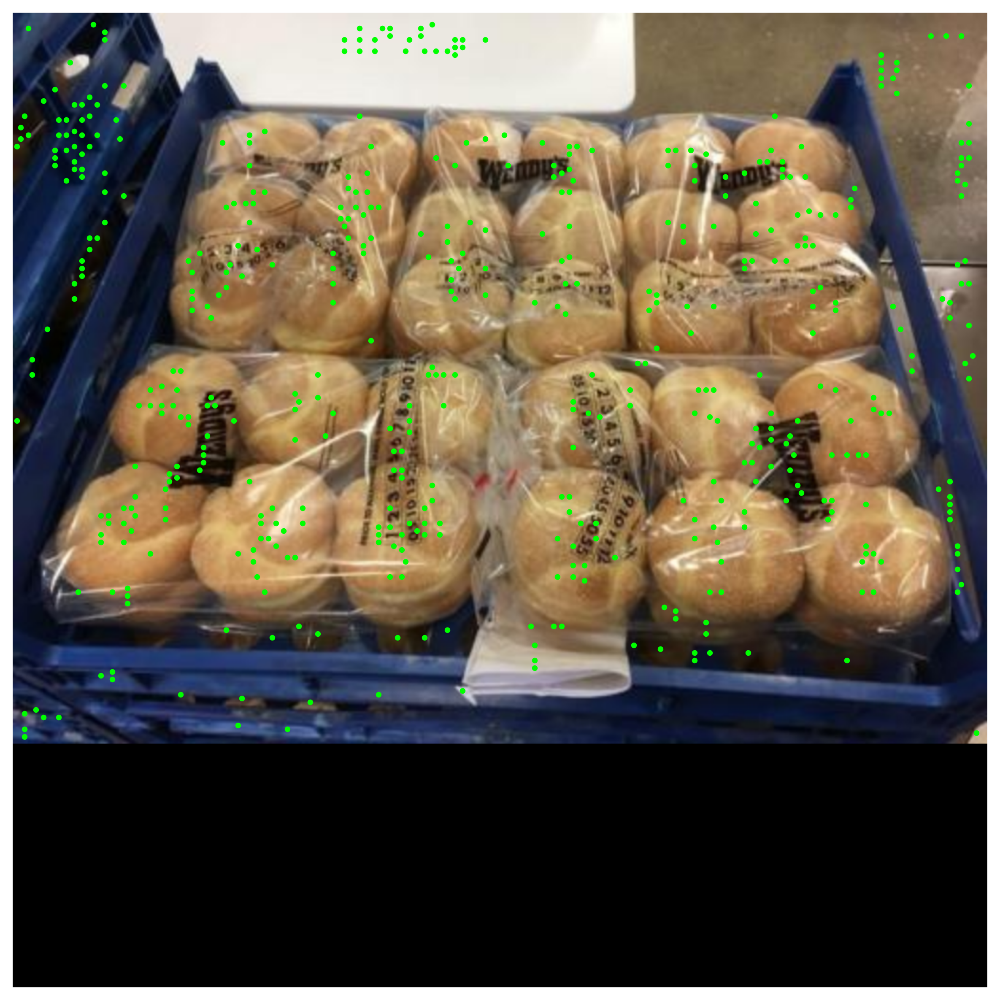

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
pred_points = outputs_heatmaps['pred_points'].squeeze().reshape(-1, 2)
pred_points_score = outputs_heatmaps['pred_points_score'].squeeze()
print(pred_points.size())
plt.scatter(pred_points[:, 0].cpu(), pred_points[:, 1].cpu(), s=20, marker='.', c='lime')
plt.axis('off')
# # plt.show()
# plt.savefig('/home/zzhuang/tmp.jpg', bbox_inches='tight', pad_inches = 0,dpi=400)

In [ ]:
pred_points.size()

torch.Size([515, 2])

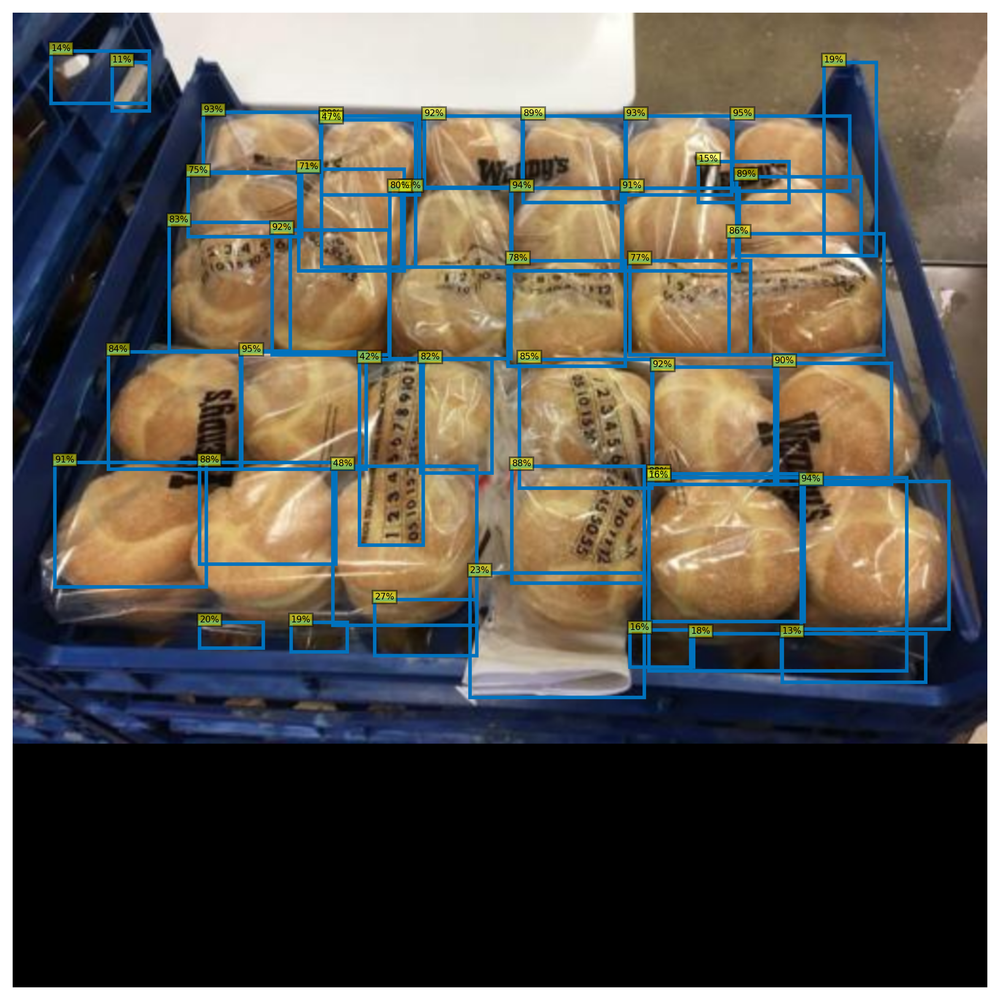

In [ ]:
_ = cls_head.eval()
with torch.no_grad():
    all_pred_boxes = []
    all_pred_ious = []
    cls_outs = []
    for indices in torch.arange(len(pred_points)).split(128):
        with torch.no_grad():
            outputs_points = sam.forward_sam_with_embeddings(features, points=pred_points[indices])
            pred_boxes = outputs_points['pred_boxes']
            pred_logits = outputs_points['pred_ious']

            for anchor_size in [8, ]:
                anchor = torch.Tensor([[-anchor_size, -anchor_size, anchor_size, anchor_size]]).cuda()
                anchor_boxes = pred_points[indices].repeat(1, 2) + anchor
                anchor_boxes = anchor_boxes.clamp(0., 1024.)
                outputs_boxes = sam.forward_sam_with_embeddings(features, points=pred_points[indices], boxes=anchor_boxes)
                pred_logits = torch.cat([pred_logits, outputs_boxes['pred_ious'][:, 1].unsqueeze(1)], dim=1)
                pred_boxes = torch.cat([pred_boxes, outputs_boxes['pred_boxes'][:, 1].unsqueeze(1)], dim=1)

            all_pred_boxes.append(pred_boxes)
            all_pred_ious.append(pred_logits)
            cls_outs_ = cls_head(features, [pred_boxes, ], [example_features, ] * len(indices))
            cls_outs_ = cls_outs_.sigmoid().view(-1, len(example_features), 5).mean(1)
            pred_logits = cls_outs_ * pred_logits
        cls_outs.append(pred_logits)
    pred_boxes = torch.cat(all_pred_boxes)
    pred_ious = torch.cat(all_pred_ious)
    cls_outs = torch.cat(cls_outs)
    pred_boxes = pred_boxes[torch.arange(len(pred_boxes)), torch.argmax(cls_outs, dim=1)]
    scores = cls_outs.max(1).values
    indices = vision_ops.nms(pred_boxes, scores, 0.5)
    pred_boxes = pred_boxes[indices]
    scores = scores[indices]

plt.figure(figsize=(10,10))
COLORS = [[0.000, 0.447, 0.741], ]
plt.imshow(read_image(fname))
for p, (xmin, ymin, xmax, ymax), c in zip(scores, pred_boxes.tolist(), COLORS * len(pred_boxes)):
    if p < 0.1:
        continue
    plt.gca().add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                               fill=False, color=c,
                               linewidth=2.0,
                               ))
    text = f'{int(p*100)}%'
    plt.gca().text(xmin, ymin, text,
            fontsize=5,
            bbox=dict(facecolor='yellow',
                      boxstyle='square,pad=.25',
                      alpha=0.5)
            )
plt.axis('off')
plt.show()